## Sobel Filter <br>
>Sobel filter is used for edge detection. It works by calculating the gradient of image intensity at each pixel within the image. It finds the direction of the largest increase from light to dark and the rate of change in that direction.

### What is Edge Detection? <br>
>Edge Detection is when we use matrix math to calculate areas of different intensities of an image. Areas where there are extreme differences in the intensities of the pixel usually indicate an edge of an object. <br> <br>
>The process of edge detection significantly reduces the amount of data
and filters out unneeded information, while preserving the important
structural properties of an image.


#### References: <br>
https://www.cs.auckland.ac.nz/compsci373s1c/PatricesLectures/Edge%20detection-Sobel_2up.pdf <br>
https://www.projectrhea.org/rhea/index.php/An_Implementation_of_Sobel_Edge_Detection

### Step 1. Import

In [108]:
%matplotlib inline 
import numpy as np #to read the array of image
import matplotlib.image as img #to read the image
import matplotlib.pyplot as plt #to make some changes to a figure
import cv2 #to read the image in grayscale

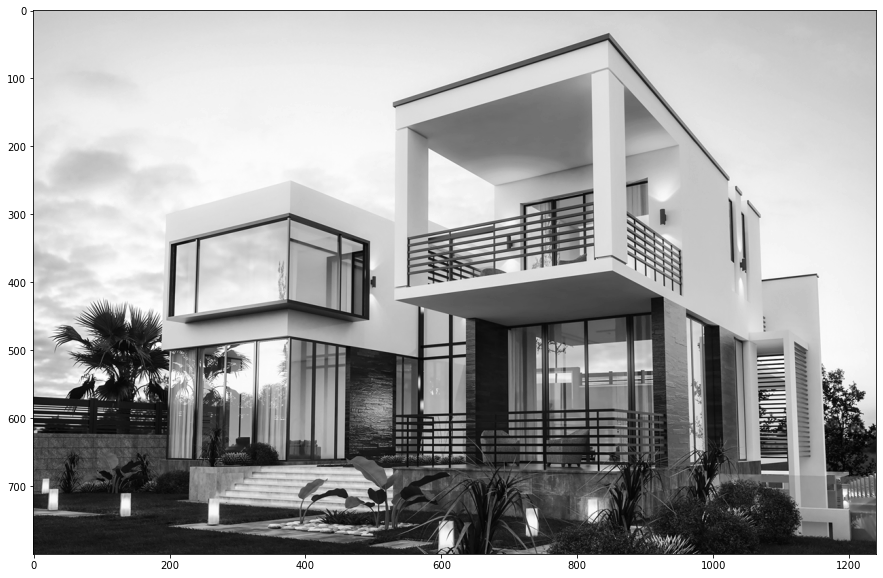

In [109]:
img = img.imread('house.jpg') #read the image
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #convert to grayscale
 
plt.figure(figsize=(20,10)) #set the image size
plt.imshow(gray, cmap='gray') #show the image

### 2. Define vertical and horizantal Sobel filters

In [110]:
vertical = [[-1,0,1], [-2,0,2], [-1,0,1]]
horizontal = [[-1,-2,-1], [0,0,0], [1,2,1]]

### 3. Get the shape of the image

In [111]:
n,m,d = img.shape
print(n,m,d)

800 1240 3


### 4. Apply horizontal filter

In [115]:
horizontal_edge = np.zeros_like(img) #for getting the horizontal edges in the image

In [116]:
for row in range(3, n-2): #loop every pixel on the image using 3x3 kernel
    for col in range(3, m-2): #loop every pixel on the image using 3x3 kernel
        local_pixels = img[row-1:row+2, col-1:col+2, 0] #to create 3x3 kernel box box on the image
        transformed_pixels = horizontal*local_pixels #multiply the vertical filter and the created 3x3 kernel box
        horizontal_score = (transformed_pixels.sum() +4)/8 #calculate the sum and normalization
        horizontal_edge[row, col] = [horizontal_score]*3 #the vertical edge image will be equaled to the score

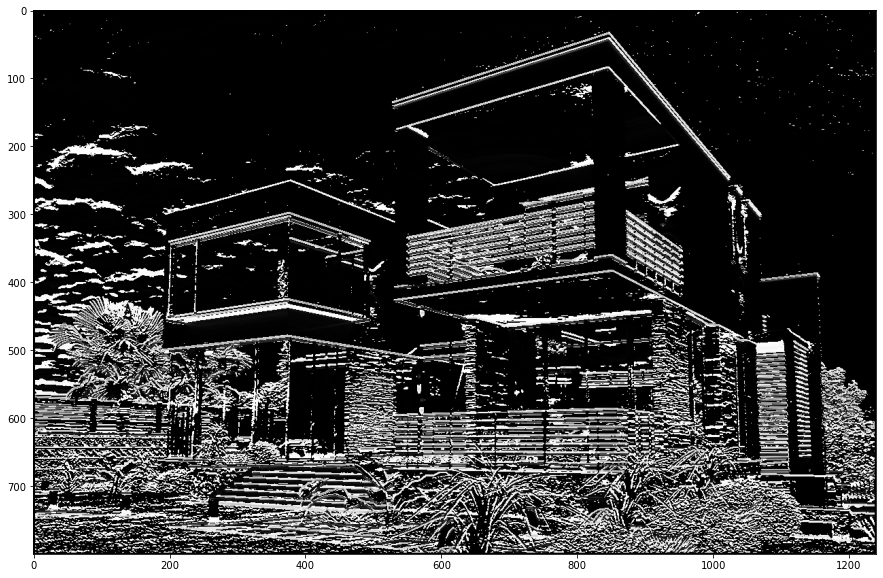

In [117]:
plt.figure(figsize=(20,10)) #set the image size
plt.imshow(horizontal_edge) #to show the image

### 5. Apply vertical filter

In [112]:
vertical_edge = np.zeros_like(img) #for getting the vertical edges in the image

In [113]:
for row in range(3, n-2): #loop every pixel on the image using 3x3 kernel
    for col in range(3, m-2): #loop every pixel on the image using 3x3 kernel
        local_pixels = img[row-1:row+2, col-1:col+2, 0] #to create 3x3 kernel box on the image
        transformed_pixels = vertical*local_pixels #multiply the vertical filter and the created 3x3 kernel box
        vertical_score = (transformed_pixels.sum() + 4)/8 #calculate the sum and normalization 
        vertical_edge[row, col] = [vertical_score]*3 #the vertical edge image will be equaled to the score

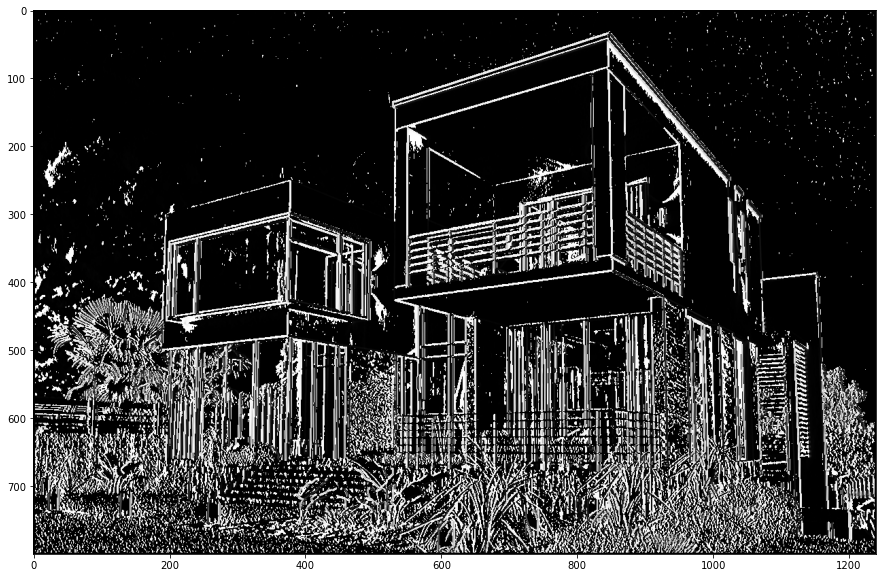

In [114]:
plt.figure(figsize=(20,10)) #set the image size
plt.imshow(vertical_edge) #to show the image

### 6. Apply vertical and horizontal filter

In [118]:
edges = np.zeros_like(img) #for getting both edges in the image

In [119]:
for row in range(3, n-2): #loop every pixel on the image
    for col in range(3, m-2): #loop every pixel on the image
        local_pixels = img[row-1:row+2, col-1:col+2, 0] #to create 3x3 kernel box on the image
        
        vertical_transformed_pixels = vertical*local_pixels
        vertical_score = vertical_transformed_pixels.sum()/4
        
        horizontal_transformed_pixels = horizontal*local_pixels
        horizontal_score = horizontal_transformed_pixels.sum()/4
        
        edge_score = (vertical_score**2 + horizontal_score**2)**.5 #averaging operation to get both the vertical and horizontal edges
        edges[row, col] = [edge_score]*3
edges = edges/edges.max()

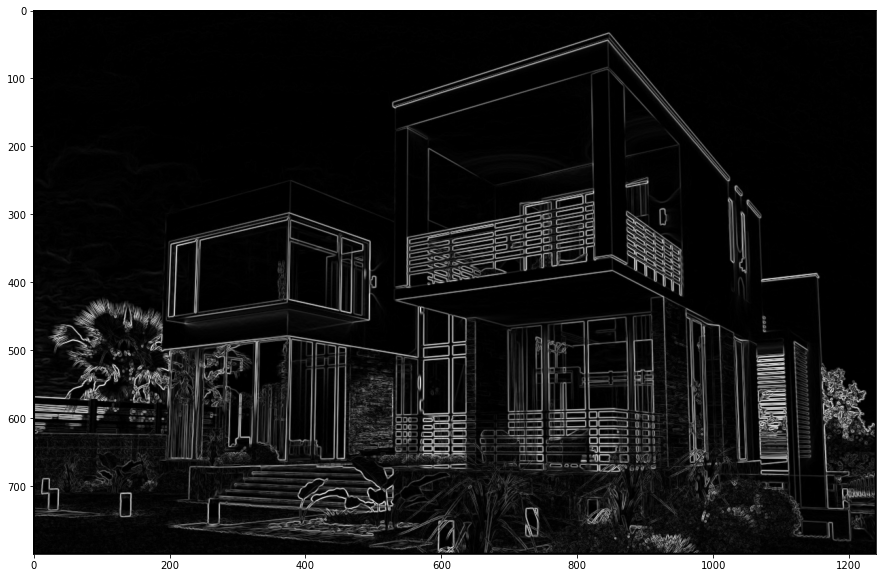

In [120]:
plt.figure(figsize=(20,10)) #set the image size
plt.imshow(edges) #to show the image

## Implementation of Sobel Filter to other images

### Stairs

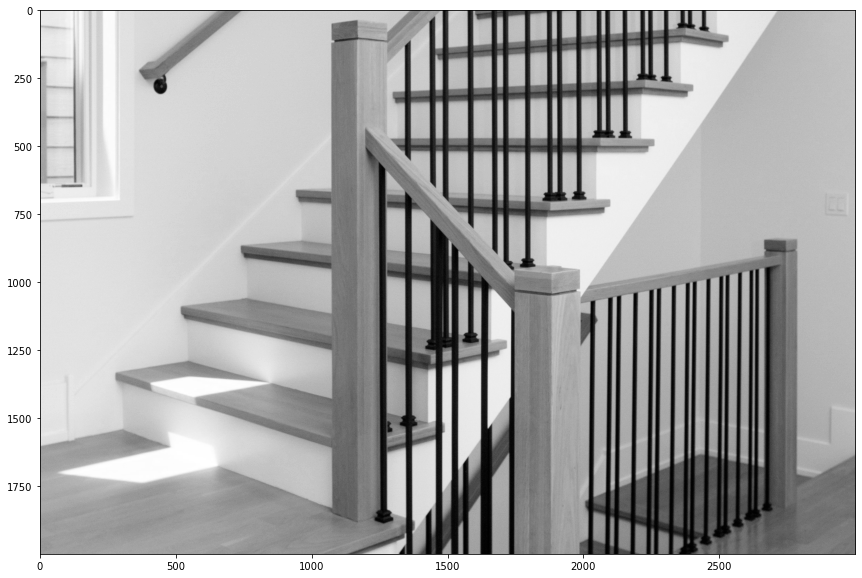

In [121]:
import matplotlib.image as img
img = img.imread('stairs.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
 
plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

In [122]:
n,m,d = img.shape
print(n,m,d)

2000 3000 3


#### Horizontal

In [126]:
horizontal_edge = np.zeros_like(img)

In [127]:
for row in range(3, n-2):
    for col in range(3, m-2):
        local_pixels = img[row-1:row+2, col-1:col+2, 0]
        transformed_pixels = horizontal*local_pixels
        horizontal_score = (transformed_pixels.sum() +4)/8
        horizontal_edge[row, col] = [horizontal_score]*3

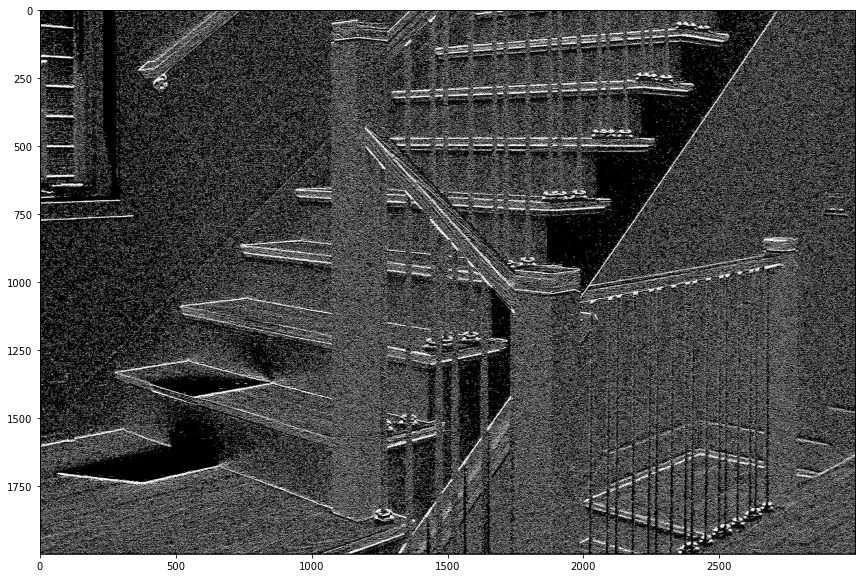

In [128]:
plt.figure(figsize=(20,10))
plt.imshow(horizontal_edge)

#### Vertical

In [123]:
vertical_edge = np.zeros_like(img)

In [124]:
for row in range(3, n-2):
    for col in range(3, m-2):
        local_pixels = img[row-1:row+2, col-1:col+2, 0]
        transformed_pixels = vertical*local_pixels
        vertical_score = (transformed_pixels.sum() + 4)/8
        vertical_edge[row, col] = [vertical_score]*3

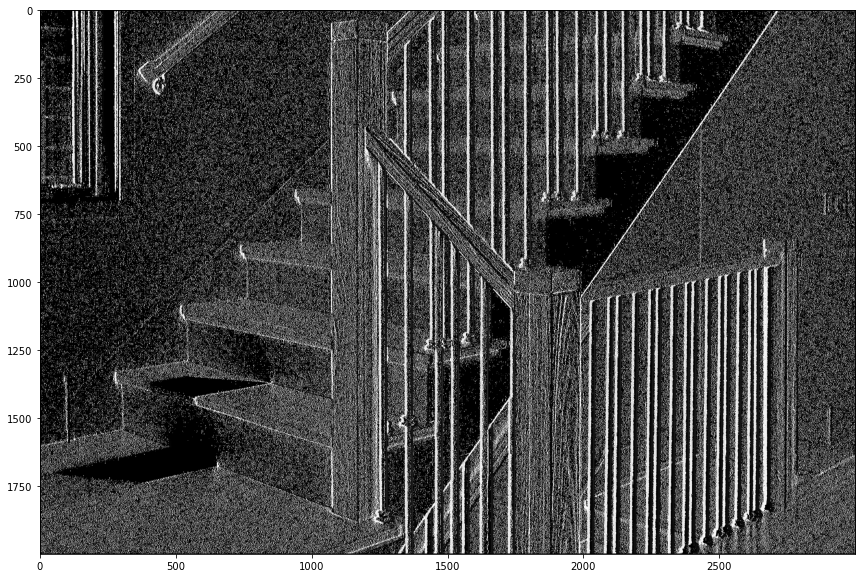

In [125]:
plt.figure(figsize=(20,10))
plt.imshow(vertical_edge)

#### Horizontal and Vertical

In [129]:
edges = np.zeros_like(img)

In [130]:
for row in range(3, n-2):
    for col in range(3, m-2):
        local_pixels = img[row-1:row+2, col-1:col+2, 0]
        
        vertical_transformed_pixels = vertical*local_pixels
        vertical_score = vertical_transformed_pixels.sum()/4
        
        horizontal_transformed_pixels = horizontal*local_pixels
        horizontal_score = horizontal_transformed_pixels.sum()/4
        
        edge_score = (vertical_score**2 + horizontal_score**2)**.5
        edges[row, col] = [edge_score]*3
edges = edges/edges.max()

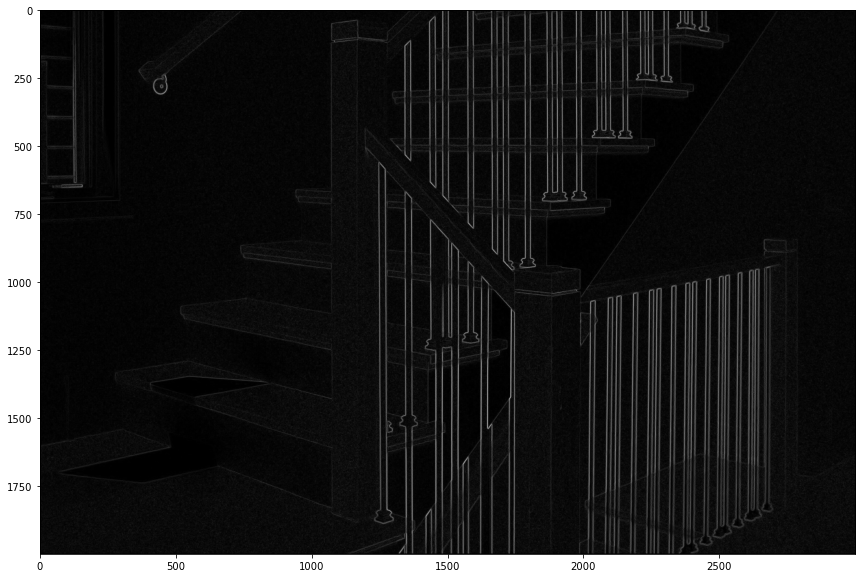

In [131]:
plt.figure(figsize=(20,10))
plt.imshow(edges)

### Rubiks Cube

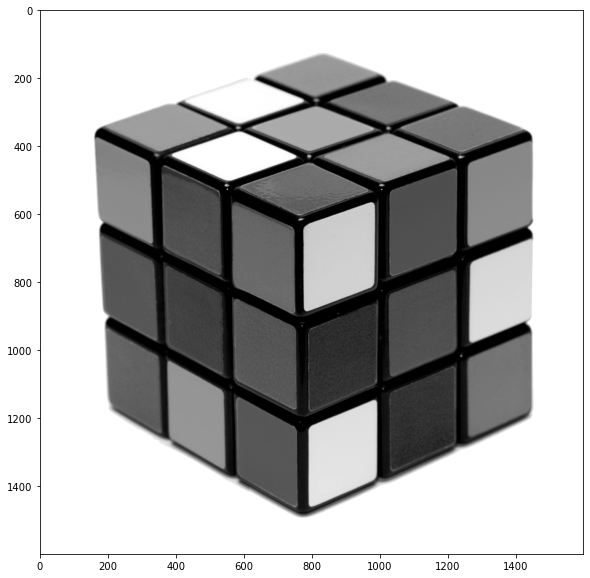

In [132]:
import matplotlib.image as img
img = img.imread('rubiks.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
 
plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

In [133]:
n,m,d = img.shape
print(n,m,d)

1600 1600 3


#### Horizontal

In [137]:
horizontal_edge = np.zeros_like(img)

In [138]:
for row in range(3, n-2):
    for col in range(3, m-2):
        local_pixels = img[row-1:row+2, col-1:col+2, 0]
        transformed_pixels = horizontal*local_pixels
        horizontal_score = (transformed_pixels.sum() +4)/8
        horizontal_edge[row, col] = [horizontal_score]*3

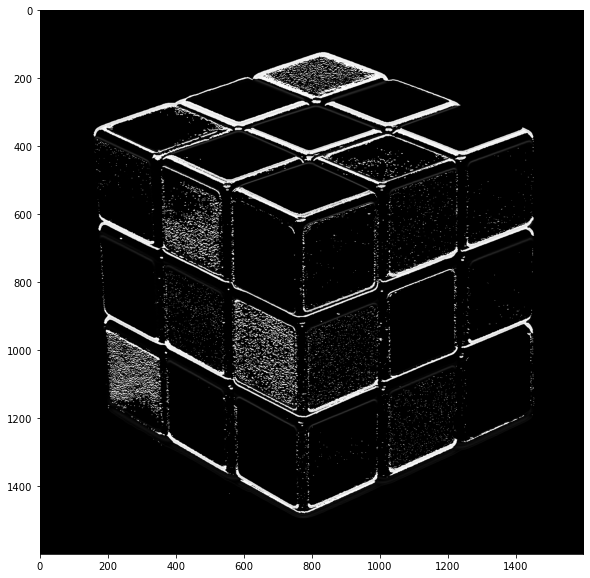

In [139]:
plt.figure(figsize=(20,10))
plt.imshow(horizontal_edge)

#### Vertical

In [134]:
vertical_edge = np.zeros_like(img)

In [135]:
for row in range(3, n-2):
    for col in range(3, m-2):
        local_pixels = img[row-1:row+2, col-1:col+2, 0]
        transformed_pixels = vertical*local_pixels
        vertical_score = (transformed_pixels.sum() + 4)/8
        vertical_edge[row, col] = [vertical_score]*3

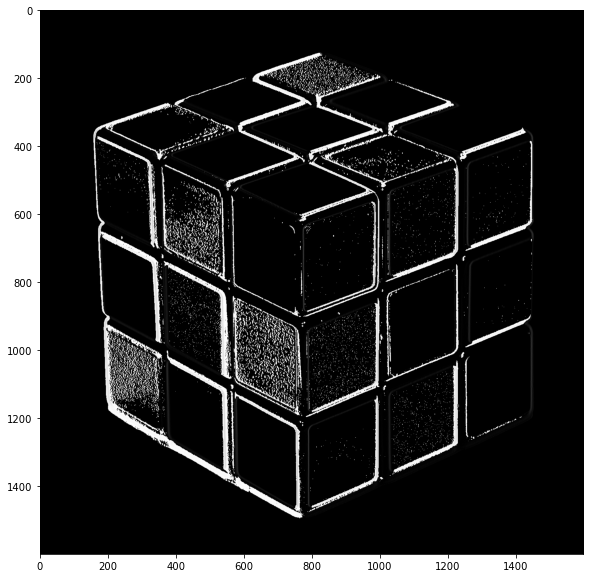

In [136]:
plt.figure(figsize=(20,10))
plt.imshow(vertical_edge)

#### Horizontal and Vertical

In [140]:
edges = np.zeros_like(img)

In [141]:
for row in range(3, n-2):
    for col in range(3, m-2):
        local_pixels = img[row-1:row+2, col-1:col+2, 0]
        
        vertical_transformed_pixels = vertical*local_pixels
        vertical_score = vertical_transformed_pixels.sum()/4
        
        horizontal_transformed_pixels = horizontal*local_pixels
        horizontal_score = horizontal_transformed_pixels.sum()/4
        
        edge_score = (vertical_score**2 + horizontal_score**2)**.5
        edges[row, col] = [edge_score]*3
edges = edges/edges.max()

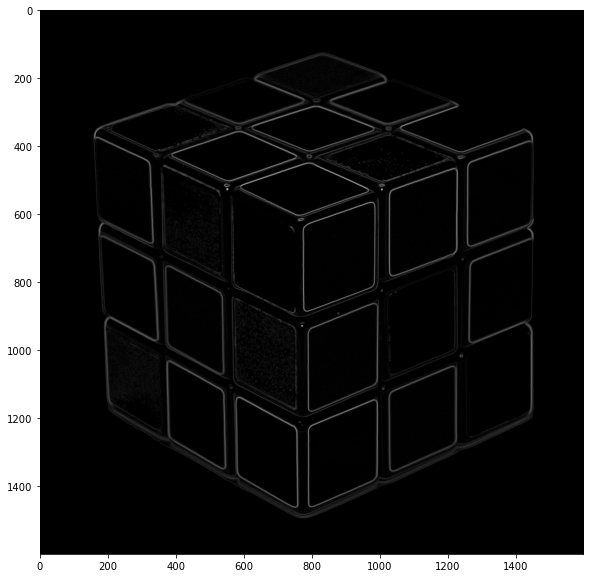

In [142]:
plt.figure(figsize=(20,10))
plt.imshow(edges)

### Street

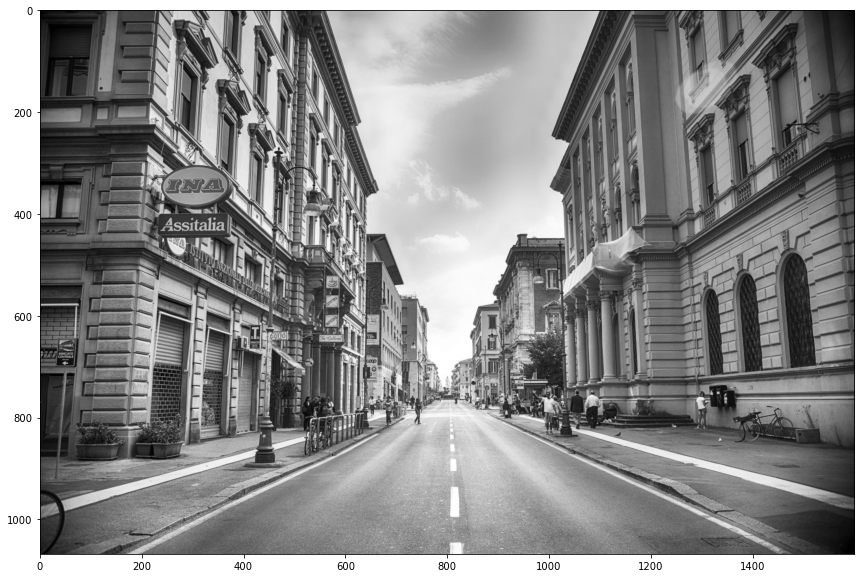

In [143]:
import matplotlib.image as img
img = img.imread('street.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
 
plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

In [144]:
n,m,d = img.shape
print(n,m,d)

1068 1600 3


#### Horizontal

In [145]:
horizontal_edge = np.zeros_like(img)

In [146]:
for row in range(3, n-2):
    for col in range(3, m-2):
        local_pixels = img[row-1:row+2, col-1:col+2, 0]
        transformed_pixels = horizontal*local_pixels
        horizontal_score = (transformed_pixels.sum() +4)/8
        horizontal_edge[row, col] = [horizontal_score]*3

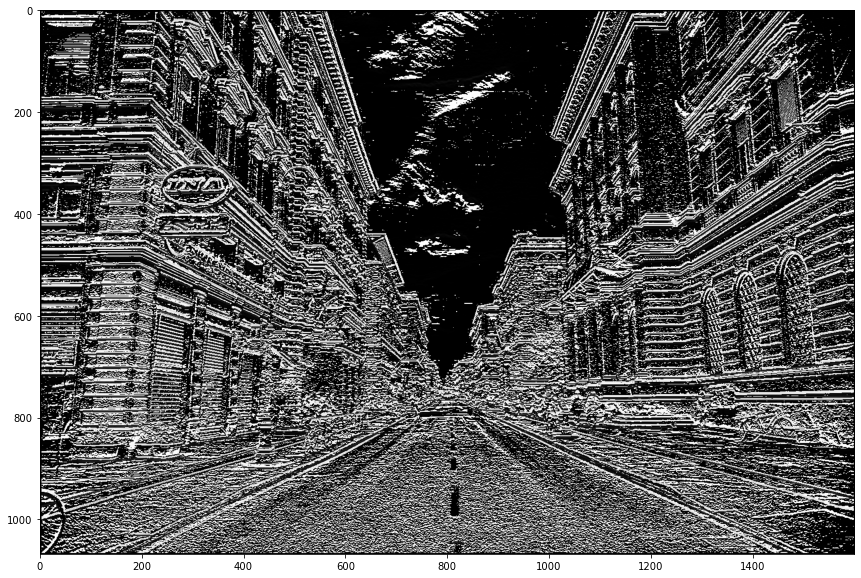

In [147]:
plt.figure(figsize=(20,10))
plt.imshow(horizontal_edge)

#### Vertical

In [148]:
vertical_edge = np.zeros_like(img)

In [149]:
for row in range(3, n-2):
    for col in range(3, m-2):
        local_pixels = img[row-1:row+2, col-1:col+2, 0]
        transformed_pixels = vertical*local_pixels
        vertical_score = (transformed_pixels.sum() + 4)/8
        vertical_edge[row, col] = [vertical_score]*3

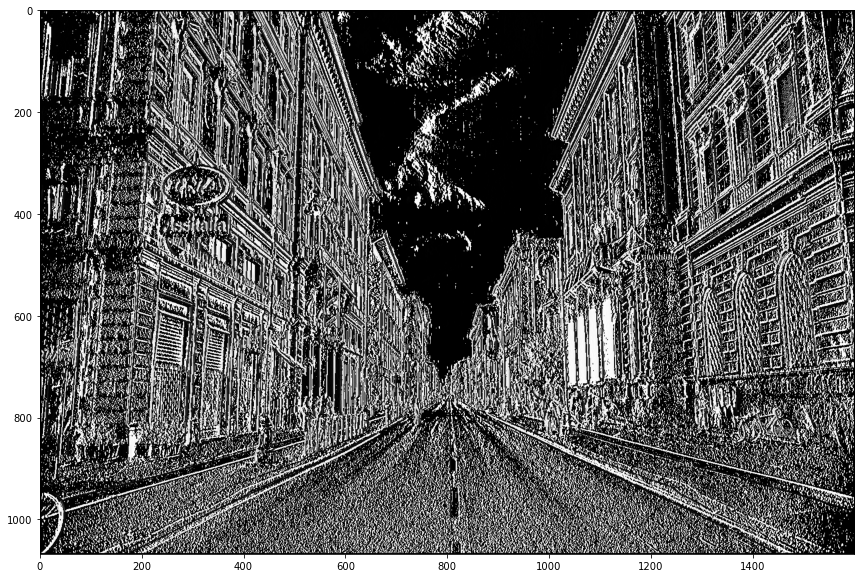

In [150]:
plt.figure(figsize=(20,10))
plt.imshow(vertical_edge)

#### Horizontal and Vertical

In [151]:
edges = np.zeros_like(img)

In [152]:
for row in range(3, n-2):
    for col in range(3, m-2):
        local_pixels = img[row-1:row+2, col-1:col+2, 0]
        
        vertical_transformed_pixels = vertical*local_pixels
        vertical_score = vertical_transformed_pixels.sum()/4
        
        horizontal_transformed_pixels = horizontal*local_pixels
        horizontal_score = horizontal_transformed_pixels.sum()/4
        
        edge_score = (vertical_score**2 + horizontal_score**2)**.5
        edges[row, col] = [edge_score]*3
edges = edges/edges.max()

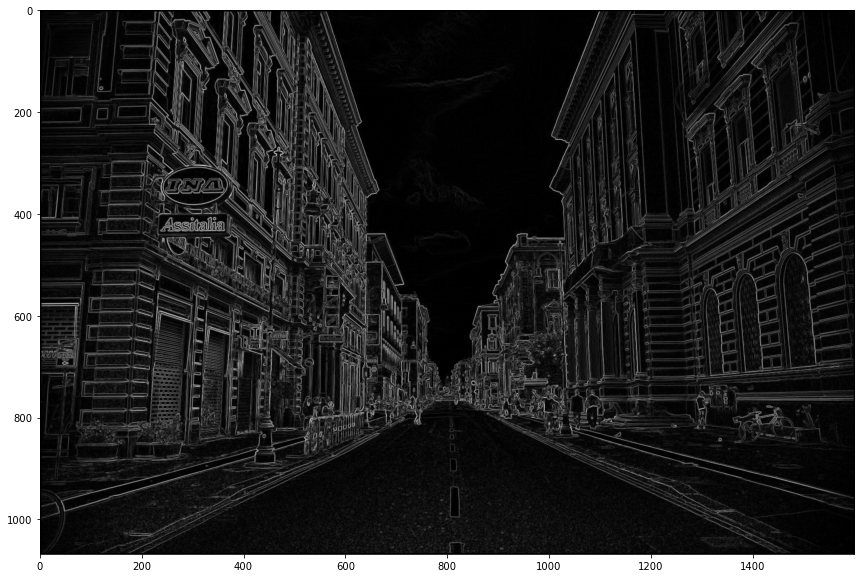

In [153]:
plt.figure(figsize=(20,10))
plt.imshow(edges)